<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:30px;font-family:Calibri;text-align:center;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b> Credit Card Defaulter Prediction </b></div>

## Importing necessary libraries 

In [35]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import make_scorer, f1_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

from sklearn.model_selection import cross_val_score

from imblearn.under_sampling import RandomUnderSampler

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '{:.2f}'.format(x))
np.set_printoptions(suppress=True)


In [2]:
# Loading train data and test data into DataFrame

data_train = pd.read_csv('credit_card_dataset_train.csv')

data_test = pd.read_csv('credit_card_dataset_test.csv')

In [3]:
# Display the firsr 5 rows of the train data

data_train.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,170000,2,2,1,52,0,0,0,0,0,0,170133,168945,160660,163652,131396,130402,7620,6200,10000,5100,5500,5000,1
1,150000,2,2,1,39,1,-2,-2,-2,-2,-2,0,0,0,0,0,0,0,0,0,0,0,0,1
2,120000,1,2,1,40,0,0,0,0,0,0,35671,37073,38472,39510,40873,42082,2000,2000,2000,2000,2000,3000,0
3,270000,2,1,2,28,-1,-1,-1,-1,0,-1,15167,841,9842,7931,3412,1035,845,9896,7977,17,1040,1848,0
4,50000,2,2,1,31,0,0,0,0,0,0,46512,47716,49675,30929,30078,29170,1974,4406,1061,1073,1046,1047,1


In [4]:
# Display the firsr 5 rows of the test data

data_test.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,30000,1,2,1,25,-1,-1,-2,-1,2,2,30527,29910,0,25919,26383,25691,1389,0,25919,1000,0,19283,0
1,50000,2,3,1,51,-1,-1,-1,-1,-2,-2,752,300,5880,0,0,0,300,5880,0,0,0,0,1
2,330000,1,1,2,44,0,0,0,0,0,0,604019,605943,439854,404157,370686,294348,19001,14000,12000,15000,7000,7000,0
3,460000,2,3,1,42,0,0,0,-2,-1,-1,43792,35047,35415,0,1619,3795,1600,1000,0,1619,3795,954,0
4,320000,1,2,2,29,0,0,0,0,0,0,324693,321110,325024,322246,297637,301575,11650,12500,11900,10503,10886,10040,0


## Data Exploration

In [5]:
print(f"Train data has {data_train.shape[0]} rows and {data_train.shape[1]} columns")
print(f"Test data has {data_test.shape[0]} rows and {data_test.shape[1]} columns")

Train data has 27000 rows and 24 columns
Test data has 3000 rows and 24 columns


### Check all the columns

In [6]:
data_train.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month'],
      dtype='object')

In [7]:
data_test.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month'],
      dtype='object')

#### Dataset information :

LIMIT_BAL : The credit limit granted to the client in New Taiwan (NT) dollars, including both individual and family/supplementary credit

SEX : Gender of the client, encoded as 1 for male and 2 for female

EDUCATION: Educational attainment of the client:
1: Graduate school
2: University
3: High School
4: Others
5 & 6: Unknown

MARRIAGE: Marital status of the client:
1: Married
2: Single
3: Others

AGE: Age of the client in years


PAY_0 to PAY_6: Repayment status for the months from April to September 2005, with the following scale:
-1: Payment was made duly
1: Payment delayed by one month
2: Payment delayed by two months, and so forth up to...
8: Payment delayed by eight months
9: Payment delayed by nine months or more.

BILL_AMT1 to BILL_AMT6: Amount of the bill statement in NT dollars for the months from April to September 2005.

PAY_AMT1 to PAY_AMT6: Amount of the previous payment made by the client in NT dollars for the months from April to September 2005.

default payment next month: Target variable indicating whether the client defaulted on payment the following month (1 = Yes, 0 = No).

## Rename the columns for better understanding 

In [8]:
# Create a dictionary with the current column names as keys and the new names as values
col_renaming = {
    'LIMIT_BAL' : 'Credit_Limit',
    'SEX' : 'Gender',
    'EDUCATION' : 'Education_Level',
    'MARRIAGE' : 'Marital_Status',
    'AGE' : 'Age',
    'PAY_0' : 'Repayment_Status_Sep',
    'PAY_2' : 'Repayment_Status_Aug',
    'PAY_3' : 'Repayment_Status_July',
    'PAY_4' : 'Repayment_Status_June',
    'PAY_5' : 'Repayment_Status_May',
    'PAY_6' : 'Repayment_Status_April',
    'BILL_AMT1' : 'Bill_Statement_Sept',
    'BILL_AMT2' : 'Bill_Statement_Aug',
    'BILL_AMT3' : 'Bill_Statement_July',
    'BILL_AMT4' : 'Bill_Statement_June',
    'BILL_AMT5' : 'Bill_Statement_May',
    'BILL_AMT6' : 'Bill_Statement_April',
    'PAY_AMT1' : 'Previous_Payment_Sept',
    'PAY_AMT2' : 'Previous_Payment_Aug',
    'PAY_AMT3' : 'Previous_Payment_July',
    'PAY_AMT4' : 'Previous_Payment_June',
    'PAY_AMT5' : 'Previous_Payment_May',
    'PAY_AMT6' : 'Previous_Payment_April',
    'default payment next month' : 'Default_Payment_Next_Month'
}

# Rename the columns in the DataFrame
data_train.rename(columns = col_renaming, inplace = True)
data_test.rename(columns = col_renaming, inplace = True)

In [9]:
print(data_train.columns)
print(data_test.columns)

Index(['Credit_Limit', 'Gender', 'Education_Level', 'Marital_Status', 'Age',
       'Repayment_Status_Sep', 'Repayment_Status_Aug', 'Repayment_Status_July',
       'Repayment_Status_June', 'Repayment_Status_May',
       'Repayment_Status_April', 'Bill_Statement_Sept', 'Bill_Statement_Aug',
       'Bill_Statement_July', 'Bill_Statement_June', 'Bill_Statement_May',
       'Bill_Statement_April', 'Previous_Payment_Sept', 'Previous_Payment_Aug',
       'Previous_Payment_July', 'Previous_Payment_June',
       'Previous_Payment_May', 'Previous_Payment_April',
       'Default_Payment_Next_Month'],
      dtype='object')
Index(['Credit_Limit', 'Gender', 'Education_Level', 'Marital_Status', 'Age',
       'Repayment_Status_Sep', 'Repayment_Status_Aug', 'Repayment_Status_July',
       'Repayment_Status_June', 'Repayment_Status_May',
       'Repayment_Status_April', 'Bill_Statement_Sept', 'Bill_Statement_Aug',
       'Bill_Statement_July', 'Bill_Statement_June', 'Bill_Statement_May',
       'Bill_S

## Check for Missing Values

In [10]:
data_train.isnull().sum()

Credit_Limit                  0
Gender                        0
Education_Level               0
Marital_Status                0
Age                           0
Repayment_Status_Sep          0
Repayment_Status_Aug          0
Repayment_Status_July         0
Repayment_Status_June         0
Repayment_Status_May          0
Repayment_Status_April        0
Bill_Statement_Sept           0
Bill_Statement_Aug            0
Bill_Statement_July           0
Bill_Statement_June           0
Bill_Statement_May            0
Bill_Statement_April          0
Previous_Payment_Sept         0
Previous_Payment_Aug          0
Previous_Payment_July         0
Previous_Payment_June         0
Previous_Payment_May          0
Previous_Payment_April        0
Default_Payment_Next_Month    0
dtype: int64

In [11]:
data_test.isnull().sum()

Credit_Limit                  0
Gender                        0
Education_Level               0
Marital_Status                0
Age                           0
Repayment_Status_Sep          0
Repayment_Status_Aug          0
Repayment_Status_July         0
Repayment_Status_June         0
Repayment_Status_May          0
Repayment_Status_April        0
Bill_Statement_Sept           0
Bill_Statement_Aug            0
Bill_Statement_July           0
Bill_Statement_June           0
Bill_Statement_May            0
Bill_Statement_April          0
Previous_Payment_Sept         0
Previous_Payment_Aug          0
Previous_Payment_July         0
Previous_Payment_June         0
Previous_Payment_May          0
Previous_Payment_April        0
Default_Payment_Next_Month    0
dtype: int64

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* No missing values are present

## Duplicate records

In [12]:
print("No of duplicates in Train data:", data_train.duplicated().sum())
print("No of duplicates in Test data:", data_test.duplicated().sum())

No of duplicates in Train data: 26
No of duplicates in Test data: 1


In [13]:
## Dropping these duplicates

data_train = data_train.drop_duplicates()
data_test = data_test.drop_duplicates()

In [14]:
## Recheck duplicates after removing duplicates
print("No of duplicates in Train data:", data_train.duplicated().sum())
print("No of duplicates in Test data:", data_test.duplicated().sum())

No of duplicates in Train data: 0
No of duplicates in Test data: 0


## Analyze columns and req transformation

### Gender : 1 -> Male, 2 -> Female

In [15]:
print(data_train['Gender'].value_counts())

print('**********************************')

print(data_test['Gender'].value_counts())

Gender
2    16315
1    10659
Name: count, dtype: int64
**********************************
Gender
2    1779
1    1220
Name: count, dtype: int64


### Education_Level 1 = graduate school; 2 = university; 3 = high school; 4= others

In [16]:
print(data_train['Education_Level'].value_counts())

print('**********************************')

print(data_test['Education_Level'].value_counts())

Education_Level
2    12587
1     9505
3     4462
5      248
4      115
6       47
0       10
Name: count, dtype: int64
**********************************
Education_Level
2    1434
1    1064
3     453
5      32
4       8
0       4
6       4
Name: count, dtype: int64


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* The dataset contains values such as 5,6 and 0 for certain columns that lack a specific description. These values can be grouped into category 4 which represents Others.

In [17]:
# identify rows where Education_Level is 5,6,0

fill_edu = (data_train['Education_Level'] == 5) | (data_train['Education_Level'] == 6) | (data_train['Education_Level'] == 0)

# Update these rows to have the value 4, which represents 'Others'
data_train.loc[fill_edu, 'Education_Level'] = 4

# # Count and display the occurrences of each unique value in the 'Education_Level' column
data_train['Education_Level'].value_counts()

Education_Level
2    12587
1     9505
3     4462
4      420
Name: count, dtype: int64

In [18]:
# identify rows where Education_Level is 5,6,0

fill_edu = (data_test['Education_Level'] == 5) | (data_test['Education_Level'] == 6) | (data_test['Education_Level'] == 0)

# Update these rows to have the value 4, which represents 'Others'
data_test.loc[fill_edu, 'Education_Level'] = 4

# # Count and display the occurrences of each unique value in the 'Education_Level' column
data_test['Education_Level'].value_counts()

Education_Level
2    1434
1    1064
3     453
4      48
Name: count, dtype: int64

### Marital_Status : 1= Married, 2= single, 3= Others

In [19]:
print(data_train['Marital_Status'].value_counts())

print('**********************************')

print(data_test['Marital_Status'].value_counts())

Marital_Status
2    14328
1    12314
3      285
0       47
Name: count, dtype: int64
**********************************
Marital_Status
2    1624
1    1330
3      38
0       7
Name: count, dtype: int64


In [20]:
# Replacing 0 of marriage with 3 (others) in train dataset

data_train['Marital_Status'] = data_train['Marital_Status'].replace({0:3})

In [21]:
# Replacing 0 of marriage with 3 (others) in test dataset

data_test['Marital_Status'] = data_test['Marital_Status'].replace({0:3})

In [22]:
# Define the mapping of column names

repayment_columns = {
    'Repayment_Status_Sep': 'PAY_0',
    'Repayment_Status_Aug': 'PAY_2',
    'Repayment_Status_July': 'PAY_3',
    'Repayment_Status_June': 'PAY_4',
    'Repayment_Status_May': 'PAY_5',
    'Repayment_Status_April': 'PAY_6'
}

# convert -1 (timely payment) to 0 in the repayemnt status columns

for new_col, old_col in repayment_columns.items():
    data_train[new_col] = data_train[new_col].replace(-1,0)
    data_test[new_col] = data_test[new_col].replace(-1,0)
    data_train[new_col] = data_train[new_col].replace(-2,-1)
    data_test[new_col] = data_test[new_col].replace(-2,-1)
    

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* Timely payments, initially as -1 in the repayment status columns, were converted to 0 and -2 converted to -1 to represent no consumption. These adjustment create a clearer and more intuitive scale for interpreting repayment behaviour, imporving the dataset's usability for analysis and modeling

In [23]:
# convert all negative 'Bill Statement' values to zero

bill_columns = ['Bill_Statement_Sept','Bill_Statement_Aug','Bill_Statement_July', 'Bill_Statement_June', 'Bill_Statement_May',
       'Bill_Statement_April']

# Replace negative values with zero in each of the bill statement columns
data_train[bill_columns] = data_train[bill_columns].clip(lower=0)
data_test[bill_columns] = data_test[bill_columns].clip(lower=0)

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* Negative values in the bill amount columns were converted to zero, as bill statemnts should not have negative values

### Statistical information for numeric columns like Credit_Limit, Age

In [24]:
# Describe statistic for specific numeric columns
numeric_cols = ['Credit_Limit', 'Age']
data_train[numeric_cols].describe()

,Credit_Limit,Age
count,26974.00,26974.00
mean,167245.11,35.51
std,129697.45,9.25
min,10000.00,21.00
25%,50000.00,28.00
50%,140000.00,34.00
75%,240000.00,41.00
max,1000000.00,79.00


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* **Credit_Limit :**
    * Mean : The average credit limit is approximately 167245.11 NT dollars.
    * Range : Credit limit range from 10,000 NT dollars to 10,00,000 NT dollars
    * Distribution: 50% of clients have a credit limit of 1,40,000 NT dollars or less with a standard deviation of about 1,29,697 NT dollars, indicating variability in credit limits.

* **Age :**
    * Mean : The average age of clients is about 35.5 years.
    * Range : Ages range from 21 to 79 years.
    * Distribution : 50% of clients ate 34 years old or younger, with a standard deviation of 9.25 years, suggesting a relatively young client base.

## Histogram plot and Box plot to check the data distribution

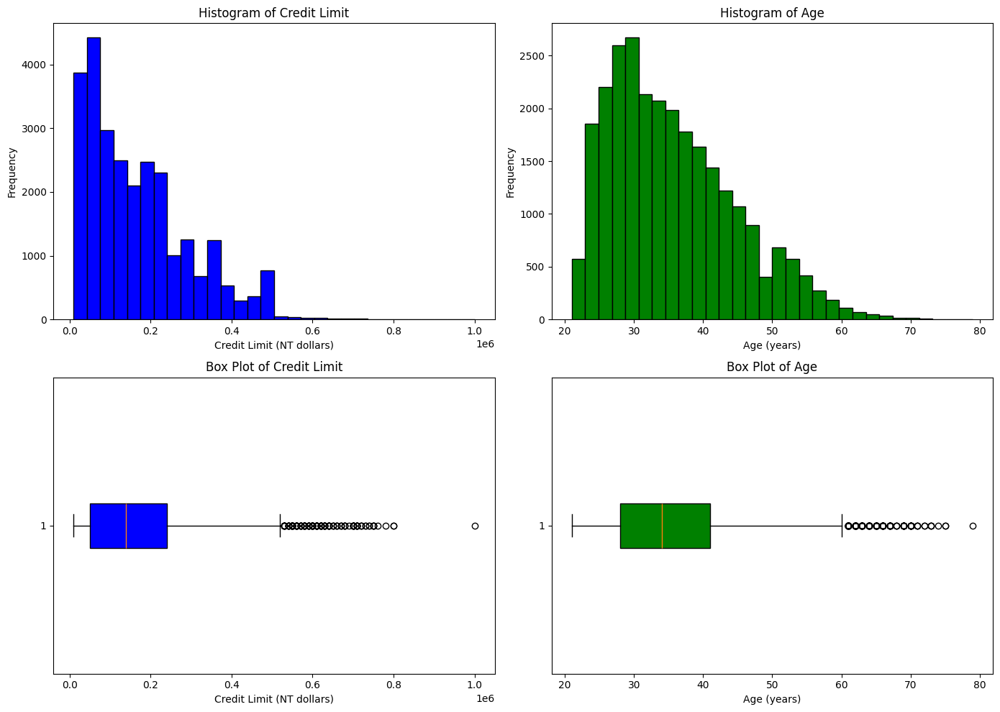

In [25]:
# Create a 2x2 grid of plots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Histogram for Credit_Limit
axes[0, 0].hist(data_train['Credit_Limit'], bins=30, color='blue', edgecolor='black')
axes[0, 0].set_title('Histogram of Credit Limit')
axes[0, 0].set_xlabel('Credit Limit (NT dollars)')
axes[0, 0].set_ylabel('Frequency')

# Histogram for Age
axes[0, 1].hist(data_train['Age'], bins=30, color='green', edgecolor='black')
axes[0, 1].set_title('Histogram of Age')
axes[0, 1].set_xlabel('Age (years)')
axes[0, 1].set_ylabel('Frequency')

# Box plot for Credit_Limit
axes[1, 0].boxplot(data_train['Credit_Limit'], vert=False, patch_artist=True, boxprops=dict(facecolor='blue'))
axes[1, 0].set_title('Box Plot of Credit Limit')
axes[1, 0].set_xlabel('Credit Limit (NT dollars)')

# Box plot for Age
axes[1, 1].boxplot(data_train['Age'], vert=False, patch_artist=True, boxprops=dict(facecolor='green'))
axes[1, 1].set_title('Box Plot of Age')
axes[1, 1].set_xlabel('Age (years)')

# Adjust layout
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* **Credit_Limit :**
    * The histogram shows a right-skewed distribution, with most clients having a credit limit
    between 0 and 200000 NT dollars.
    * The box plot confirms the presence of outliers in the higher credit limit range, indicating a few clients have significanlty higher credit limits compared to the majority.
 
* **Age :**
    * The histogram shows that, most clients aged between 25 and 40 years. The box plot shows a relatively even distribution with some outliers , particularly in the older age group (above 60 years).

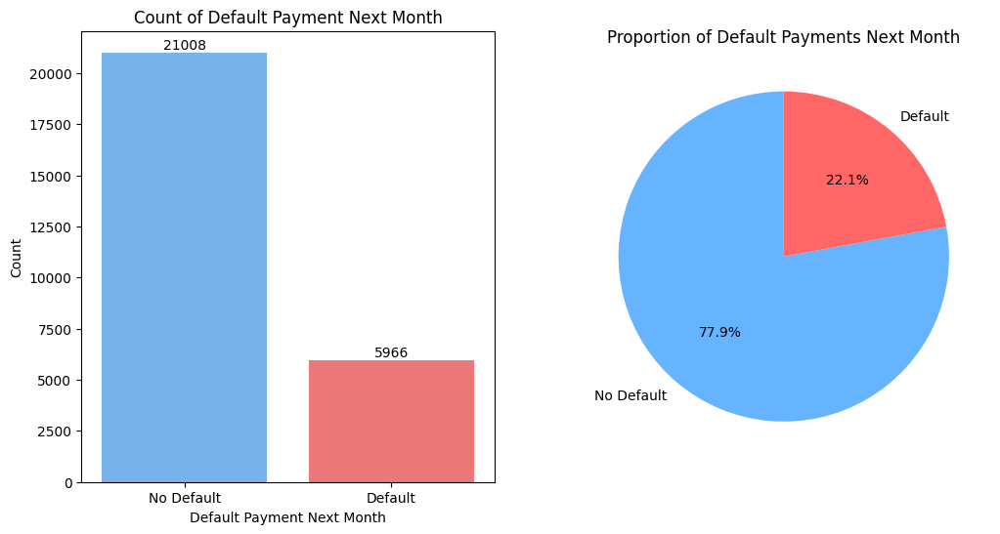

In [26]:
plt.figure(figsize=(12,6))
# Countplot for Default Payment Next Month
plt.subplot(1,2,1)
ax = sns.countplot(x = data_train['Default_Payment_Next_Month'],palette=['#66b3ff', '#ff6666'])
for container in ax.containers:
    ax.bar_label(container)
plt.title("Count of Default Payment Next Month")
plt.xlabel("Default Payment Next Month")
plt.ylabel("Count")
plt.xticks([0, 1], ['No Default', 'Default'], fontsize=10)

# Pie chart for Default Payment Next Month

# Count the values of default payments
default_counts = data_train['Default_Payment_Next_Month'].value_counts()

# Labels and values for the pie chart
labels = ['No Default', 'Default']
values = [default_counts[0], default_counts[1]]

plt.subplot(1,2,2)
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#66b3ff', '#ff6666'])
plt.title('Proportion of Default Payments Next Month')
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* The plot shows that 22.1% of clients defaulted, while 77.9% did not, indicating an imbalanced dataset with more non-default cases. This imbalance should be considered in any predictive modeling approach.

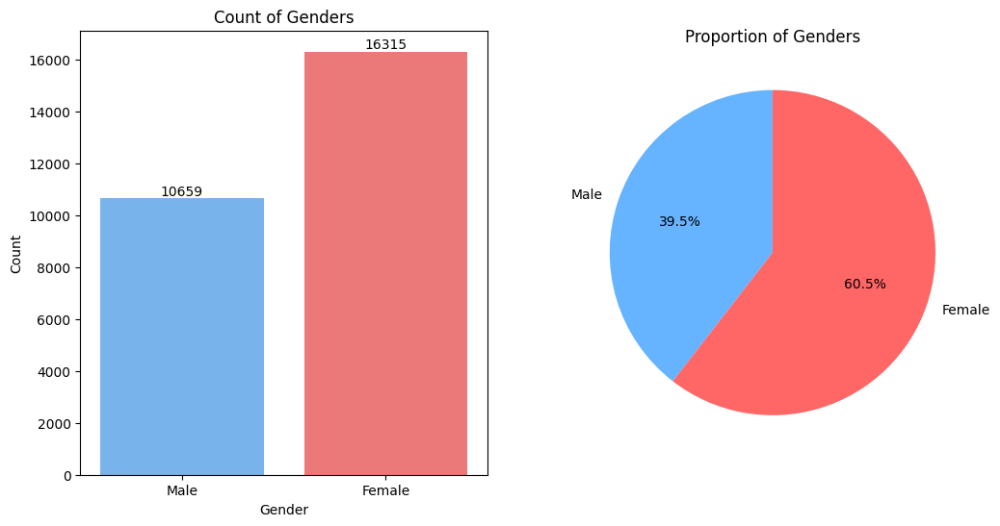

In [27]:
plt.figure(figsize=(12,6))
# Countplot for Gender
plt.subplot(1,2,1)
ax = sns.countplot(x = data_train['Gender'],palette=['#66b3ff', '#ff6666'])
for container in ax.containers:
    ax.bar_label(container)
plt.title("Count of Genders")
plt.xlabel("Gender")
plt.ylabel("Count")
plt.xticks([0, 1], ['Male', 'Female'], fontsize=10)

# Pie chart for Gender

# Count the values of Gender
gender = data_train['Gender'].value_counts()

# Labels and values for the pie chart
labels = ['Male', 'Female']
values = [gender[1], gender[2]]

plt.subplot(1,2,2)
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#66b3ff', '#ff6666'])
plt.title('Proportion of Genders')
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* The dataset is skewed towards females, who make up 60.5% of the population, while males represent 39.5%

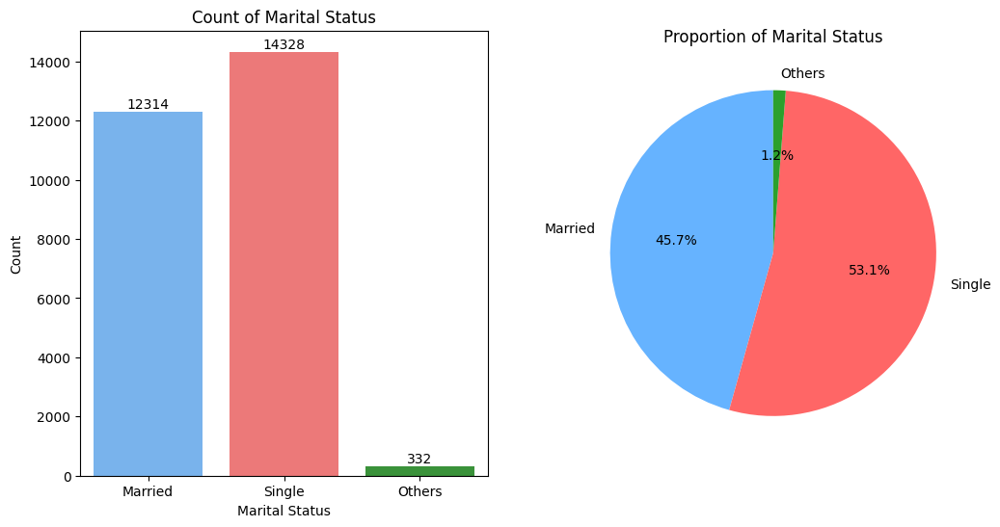

In [28]:
plt.figure(figsize=(12,6))

# Countplot for Marital Status
plt.subplot(1,2,1)
ax = sns.countplot(x = data_train['Marital_Status'],palette=['#66b3ff', '#ff6666','#2ca02c'])
for container in ax.containers:
    ax.bar_label(container)
plt.title("Count of Marital Status")
plt.xlabel("Marital Status")
plt.ylabel("Count")
plt.xticks([0, 1,2], ['Married', 'Single', 'Others'], fontsize=10)

# Pie chart for Marital Status

marital_status = data_train['Marital_Status'].value_counts()

# Labels and values for the pie chart
labels = ['Married', 'Single', 'Others']
values = [marital_status[1], marital_status[2], marital_status[3] ]

plt.subplot(1,2,2)
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#66b3ff', '#ff6666','#2ca02c'])
plt.title('Proportion of Marital Status')
plt.show()


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* **Marital Status Distribution** : The majority of clients in the dataset are Single(53.1%), followed by married (45.7%), with a small percentage of(1.2%) categorized as Others. This suggested that the dataset is fairly balanced between married and single clients, but with a slight majority of married and single individuals.
* **Proportion of Marital Status** : The distribution of marital status indicates that single cleints forms a largest group, which may influence patterns in credit behaviour and default rates in subsequent analysis

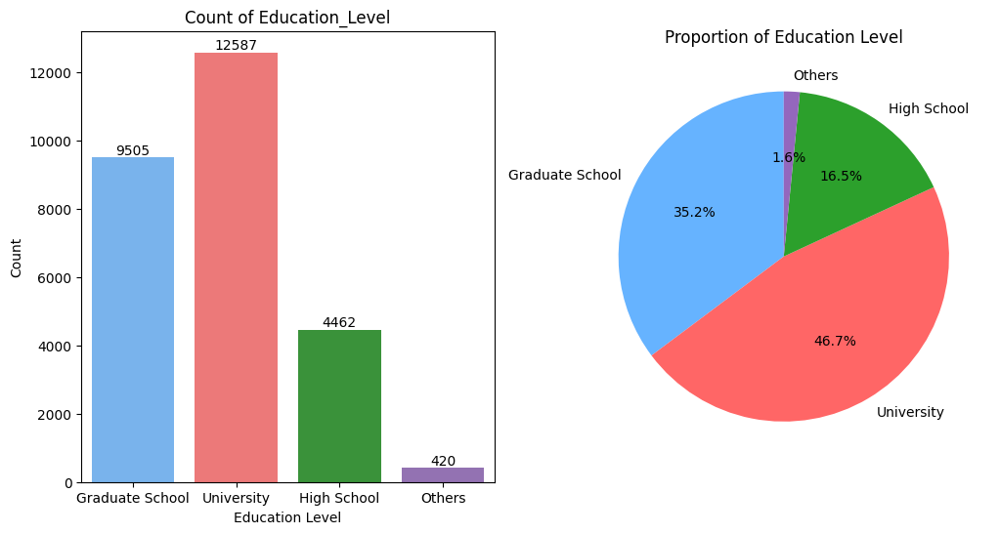

In [29]:
plt.figure(figsize=(12,6))

# Countplot for Education Level
plt.subplot(1,2,1)
ax = sns.countplot(x = data_train['Education_Level'],palette=['#66b3ff', '#ff6666','#2ca02c','#9467bd'])
for container in ax.containers:
    ax.bar_label(container)
plt.title("Count of Education_Level")
plt.xlabel("Education Level")
plt.ylabel("Count")
plt.xticks([0, 1,2,3], ['Graduate School', 'University', 'High School', 'Others'], fontsize=10)

# Pie chart for Education Level

edu_lvl = data_train['Education_Level'].value_counts()

# Labels and values for the pie chart
labels = ['Graduate School', 'University', 'High School', 'Others']
values = [edu_lvl[1], edu_lvl[2], edu_lvl[3],edu_lvl[4] ]

plt.subplot(1,2,2)
plt.pie(values, labels=labels, autopct='%1.1f%%', startangle=90, colors=['#66b3ff', '#ff6666','#2ca02c','#9467bd'])
plt.title('Proportion of Education Level')
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* **Education Level Distribution** : The majority of clients have a university education (46.7%), followed by graduate school (35.2%), and high schol (16.5%). A small percentage (1.6%) falls into Other category. This distribution shows a higher concentration of clients with advanced education levels, which could influence credit card behaviour and default risk


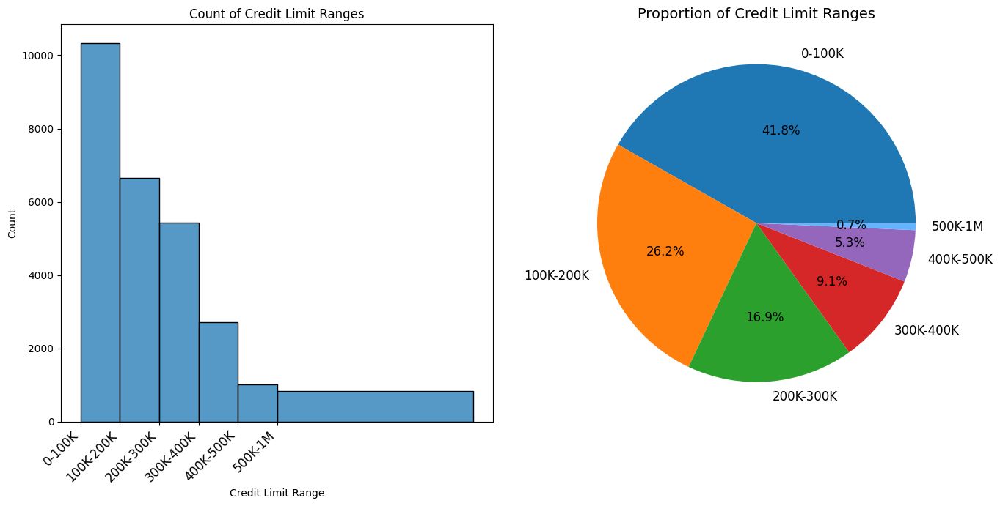

In [30]:
# Define bins and labels directly for plotting
bins = [0, 100000, 200000, 300000, 400000, 500000, 1000000]  # 6 intervals + 1 edge = 7 values
labels = ['0-100K', '100K-200K', '200K-300K', '300K-400K', '400K-500K', '500K-1M']  # 6 labels

# Define custom colors for the pie chart
custom_colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#66b3ff']

# Create a subplot with 1 row and 2 columns for Credit Limit
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Plot the histogram for binned Credit Limit in the first subplot
sns.histplot(data_train['Credit_Limit'], bins=bins, kde=False, palette=custom_colors, ax=axes[0])
axes[0].set_title('Count of Credit Limit Ranges')
axes[0].set_xlabel('Credit Limit Range')
axes[0].set_ylabel('Count')

# Manually set x-tick labels to match the labels defined for the bins
axes[0].set_xticks(bins[:-1])  # Set the x-ticks to correspond to the start of each interval (excluding the last bin edge)
axes[0].set_xticklabels(labels, rotation=45, ha="right", fontsize=12)

# Calculate the counts for the pie chart
credit_limit_counts = pd.cut(data_train['Credit_Limit'], bins=bins, labels=labels, include_lowest=True).value_counts().sort_index()

# Create a pie chart in the second subplot with custom colors
axes[1].pie(credit_limit_counts, labels=credit_limit_counts.index, autopct='%1.1f%%', colors=custom_colors, textprops={'fontsize': 12})
axes[1].set_title('Proportion of Credit Limit Ranges', fontsize=14)

# Adjust layout
plt.tight_layout()
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* Most clients have credit limits in the 0-100K range(41.8%), with fewer clients in higher ranges, indicating a concentration of lower credit limits in the dataset

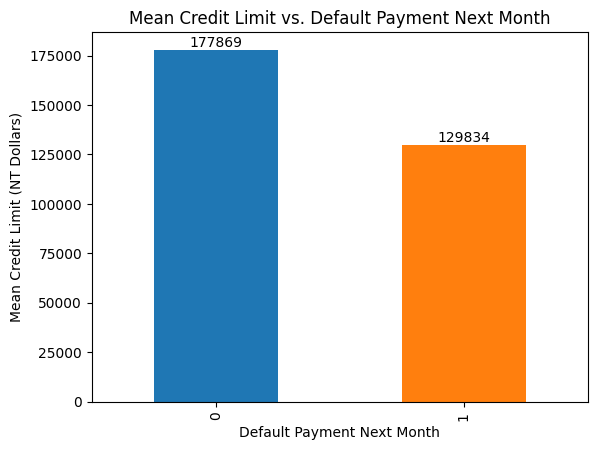

In [31]:
# Group by the target variable and calculate the mean credit Limit

ax = data_train.groupby('Default_Payment_Next_Month')['Credit_Limit'].mean().plot.bar(color =['#1f77b4', '#ff7f0e'])

for container in ax.containers:
    ax.bar_label(container)

# Set the title and labels
plt.title('Mean Credit Limit vs. Default Payment Next Month')
plt.xlabel('Default Payment Next Month')
plt.ylabel('Mean Credit Limit (NT Dollars)')

# Display the plot
plt.show()




<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* The plot shows that clients who did not default on their payment next month tend to have higher average credit limit (around 1,75,000 NT dollars) compared to those who did default (Around 1,25,000 NT dollars). This suggests having a higher credit limit may be associated with a lower likelihood of default

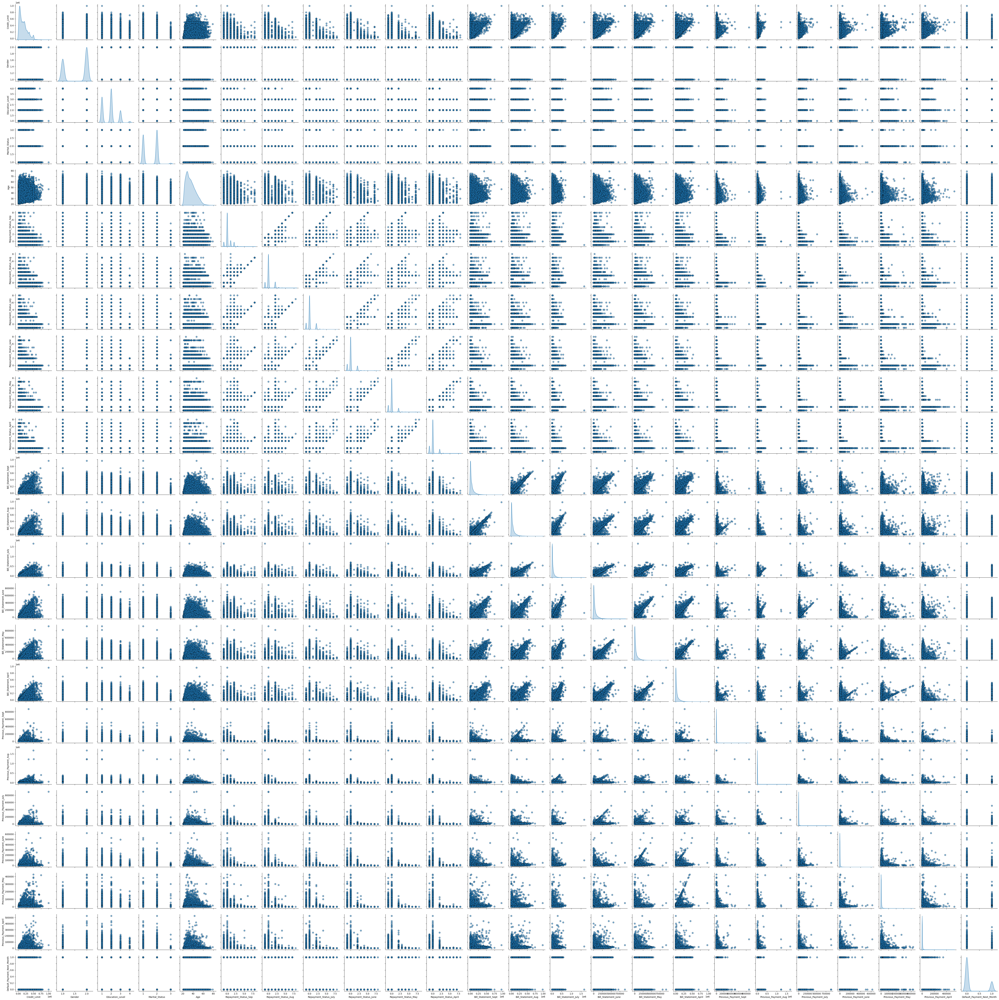

In [32]:
# Customize the appearance of the pairplot

pairplot = sns.pairplot(
    data_train,
    diag_kind = 'kde',
        plot_kws={'alpha': 0.6, 's': 50, 'edgecolor': 'k'},
)

# Adjust the layout for better spacing
plt.tight_layout()

plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* Based on the pair-plot above, it is evident that some relationships exist between the feature columns. To confirm these relationships, a correlation heatmap will be plotted

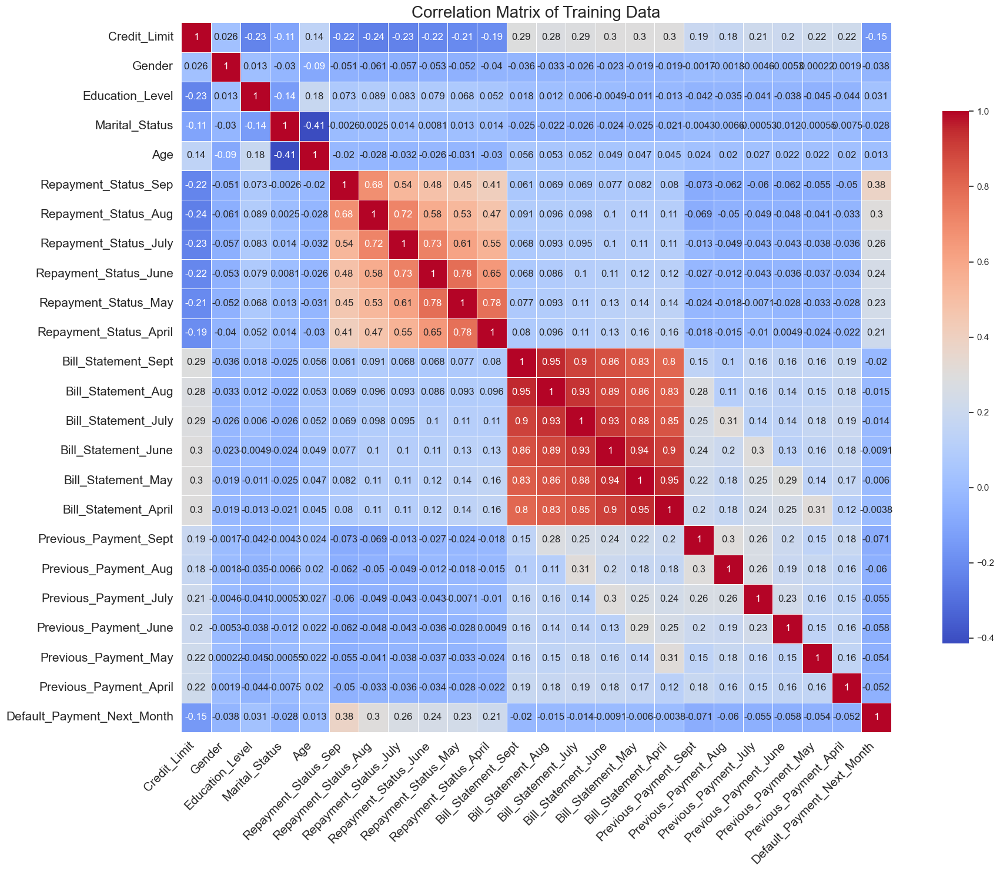

In [33]:
# Set the style of the visualization
sns.set(style="white")  # Sets a clean background style

# Set up the matplotlib figure with a larger size
plt.figure(figsize=(20, 15))

# Generate a heatmap to visualize the correlation matrix
heatmap = sns.heatmap(data_train.corr(),
                      annot=True,
                      cmap="coolwarm",
                      linewidths=0.5,
                      cbar_kws={"shrink": 0.75},
                      square=True,
                      annot_kws={"size": 12})

# Customize the title and labels
plt.title('Correlation Matrix of Training Data', fontsize=20)
plt.xticks(rotation=45, ha='right', fontsize=15)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=15)  # Set the y-axis labels size

# Add layout
plt.tight_layout()

# Show the plot
plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* The correlation heatmap reveals that there are some relationships between the feature columns indicating they are not entirely independent. For example :
    * **Repayment Staus** : There is a high correlation among the repayment status columns for different columns. This is expected, as a customer who delays payement in one month is likely to continue having issues in subsequent months
    * **Bill Amount** : Similarly, the bill amount columns for different months are highly corrleated. If a customer is unable to pay their bill, the outstanding amount is likely to remain high across multiple months.
* While these correlations exist, dropping these columns would result in a significant loss of historical data related to payments and bill amounts, which are crucial for predicting defaults. Therefore, despite the correlation, it is advisable to retain all columns to preserve the information they provide. 

## Model Training & Testing

### Split dataset into independent and dependent columns

In [37]:
X_train = data_train.drop("Default_Payment_Next_Month", axis=1)
y_train = data_train['Default_Payment_Next_Month']

X_test = data_test.drop("Default_Payment_Next_Month", axis=1)
y_test = data_test['Default_Payment_Next_Month']

## Scaling the datasets

In [38]:
scaler = MinMaxScaler()

X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns= X_test.columns)

## Attempt 1:

Base Model : Logistic Regression

Other Models : Support Vector Machine, RandomForest & XGB

No handling of class imbalance

### Base Model (Logistic Regression) train & test

In [40]:
base_model = LogisticRegression()
base_model.fit(X_train_scaled, y_train)
y_pred = base_model.predict(X_test_scaled)
base_model_report = classification_report(y_test, y_pred)
print(f"\nClassification Report for Logistic Regression:\n")
print(base_model_report)


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.83      0.96      0.89      2335
           1       0.70      0.30      0.42       664

    accuracy                           0.82      2999
   macro avg       0.76      0.63      0.65      2999
weighted avg       0.80      0.82      0.79      2999



<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* The Logistic Regression classifier shows good performance for the majority class (0) with a high F1-score of 0.89, but it struggles significantly with the minority class (1), achieving a much lower F1-score of 0.42. This indicates that the model is biased towards the majority class, reflecting an imbalance in how well the model generalizes across different classes

### Plot of Feature Importace for Base Model

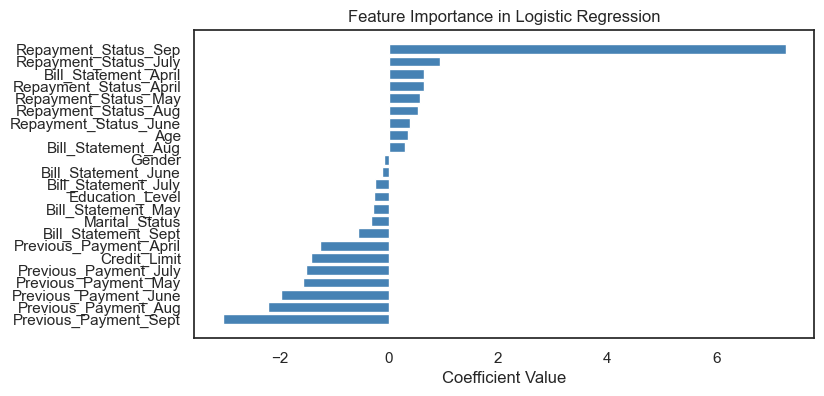

In [42]:
feature_importance = base_model.coef_[0]

# Create a DataFrame for easier handling
coef_df = pd.DataFrame(feature_importance, index=X_train_scaled.columns, columns=['Coefficients'])

# Sort the coefficients for better visualization
coef_df = coef_df.sort_values(by='Coefficients', ascending=True)

# Plotting
plt.figure(figsize=(8, 4))
plt.barh(coef_df.index, coef_df['Coefficients'], color='steelblue')
plt.xlabel('Coefficient Value')
plt.title('Feature Importance in Logistic Regression')
plt.show()

#### Training , testing and feature importance plot for other models to see the performance

Training and evaluating Support Vector Machine...

Classification Report for Support Vector Machine:

              precision    recall  f1-score   support

           0       0.83      0.96      0.89      2335
           1       0.69      0.32      0.44       664

    accuracy                           0.82      2999
   macro avg       0.76      0.64      0.67      2999
weighted avg       0.80      0.82      0.79      2999

------------------------------------------------------------
Training and evaluating Random Forest...

Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.84      0.94      0.89      2335
           1       0.63      0.36      0.45       664

    accuracy                           0.81      2999
   macro avg       0.73      0.65      0.67      2999
weighted avg       0.79      0.81      0.79      2999

------------------------------------------------------------


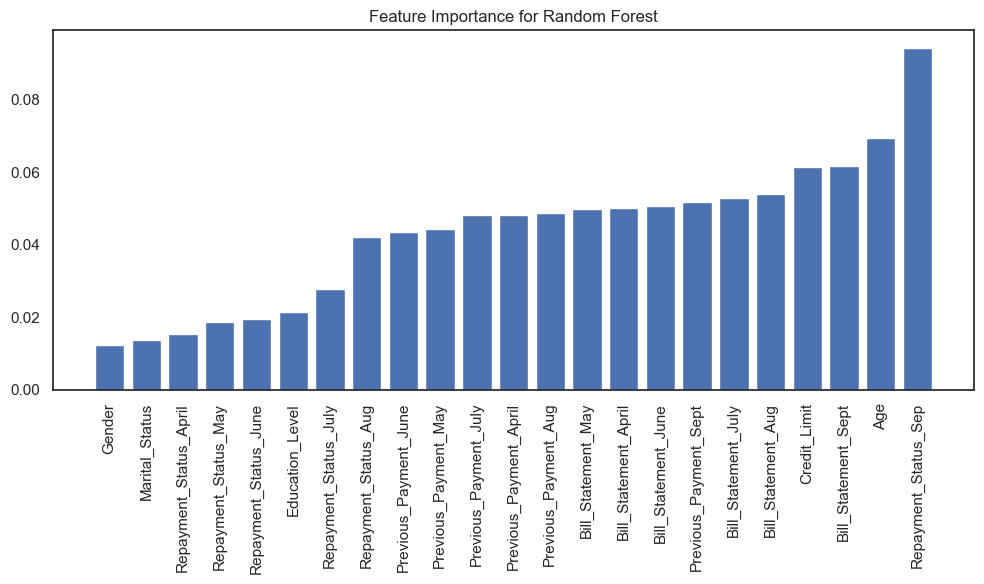

Training and evaluating XGBoost...

Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.84      0.94      0.89      2335
           1       0.62      0.37      0.46       664

    accuracy                           0.81      2999
   macro avg       0.73      0.65      0.67      2999
weighted avg       0.79      0.81      0.79      2999

------------------------------------------------------------


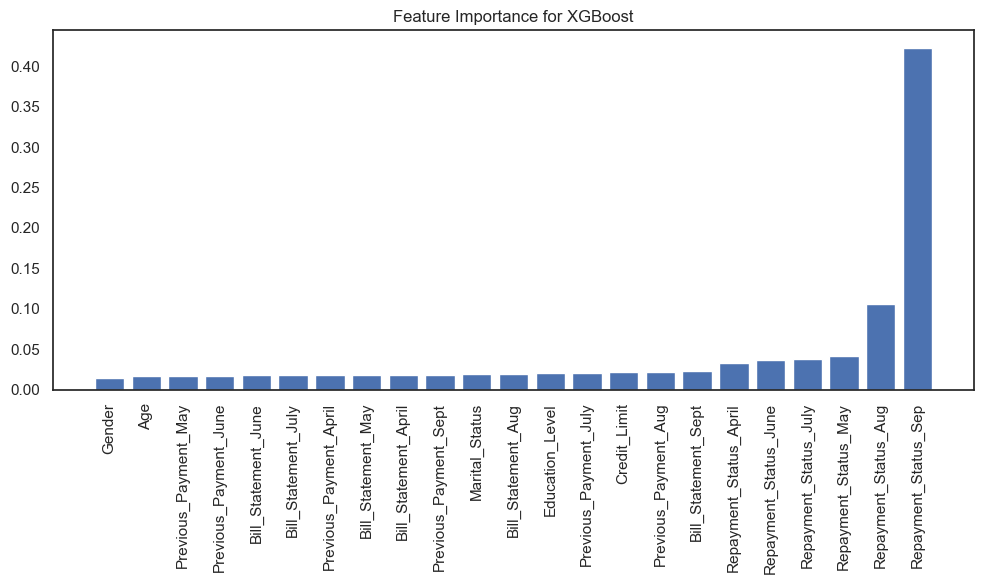

In [43]:
# Define the models to be tested

models = {
    'Support Vector Machine' : SVC(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

for name, model in models.items():
    print(f"Training and evaluating {name}...")
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    report = classification_report(y_test, y_pred)
    print(f"\nClassification Report for {name}:\n")
    print(report)
    print("-" * 60)

    # Plotting feature importance
    if hasattr(model, "feature_importances_"):
        importance = model.feature_importances_
        indices = np.argsort(importance)[::1]

        plt.figure(figsize=(10, 6))
        plt.title(f"Feature Importance for {name}")
        plt.bar(range(X_train_scaled.shape[1]), importance[indices], align="center")
        plt.xticks(range(X_train_scaled.shape[1]), X_train_scaled.columns[indices], rotation=90)
        plt.tight_layout()
        plt.show()

    

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* **Support Vector Classifier :**
    * Class 0 : F1-score of 0.89, indicating strong performance.
    * Class 1 : F1-score of 0.44, showing weaker performance.
    * Conslusion : This model is biased towards the majority class (0) with a significant drop in performance of the minority class (1)

* **Random Forest Classifier :**
    * Class 0 : F1-score of 0.89, indicating strong performance.
    * Class 1 : F1-score of 0.45, showing weaker performance.
    * Conslusion : This model performs similar to Support Vector Classifier, is biased towards the majority class (0) with a significant drop in performance of the minority class (1)

* **XGBoost:**
    * Class 0 : F1-score of 0.89, indicating strong performance.
    * Class 1 : F1-score of 0.46, showing weaker performance.
    * Conslusion : XGBoost performs similarly to Random Forest, with abias towards the majority class and difficulty in classifying the minority class.

---
* **All the three models demonstrates a bias towards the majoity class (0) with stronger F1-scores, while they struggle with the minority class(1), a sreflected by the lower F1-scores**

## Attempt 2

Handle Class Imbalance Using Under Sampling

In [47]:
rus = RandomUnderSampler(random_state=42)
X_train_res, y_train_res = rus.fit_resample(X_train_scaled, y_train)
y_train_res.value_counts()

Default_Payment_Next_Month
0    5966
1    5966
Name: count, dtype: int64

In [50]:
lr_model = LogisticRegression()
lr_model.fit(X_train_res, y_train_res)
y_lr_pred = lr_model.predict(X_test_scaled)
lr_report = classification_report(y_test, y_lr_pred)
print(f"\nClassification Report for Logistic Regression:\n")
print(lr_report)


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      2335
           1       0.48      0.55      0.51       664

    accuracy                           0.77      2999
   macro avg       0.67      0.69      0.68      2999
weighted avg       0.78      0.77      0.77      2999



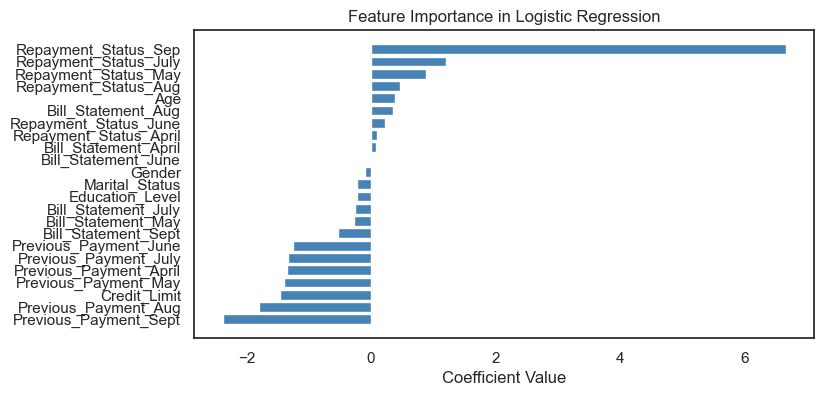

In [52]:
feature_importance = lr_model.coef_[0]

# Create a DataFrame for easier handling
coef_df = pd.DataFrame(feature_importance, index=X_train_res.columns, columns=['Coefficients'])

# Sort the coefficients for better visualization
coef_df = coef_df.sort_values(by='Coefficients', ascending=True)

# Plotting
plt.figure(figsize=(8, 4))
plt.barh(coef_df.index, coef_df['Coefficients'], color='steelblue')
plt.xlabel('Coefficient Value')
plt.title('Feature Importance in Logistic Regression')
plt.show()

Training and evaluating Support Vector Machine...

Classification Report for Support Vector Machine:

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      2335
           1       0.48      0.56      0.52       664

    accuracy                           0.77      2999
   macro avg       0.68      0.70      0.68      2999
weighted avg       0.78      0.77      0.78      2999

------------------------------------------------------------
Training and evaluating Random Forest...

Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.88      0.75      0.81      2335
           1       0.42      0.64      0.51       664

    accuracy                           0.73      2999
   macro avg       0.65      0.69      0.66      2999
weighted avg       0.78      0.73      0.74      2999

------------------------------------------------------------


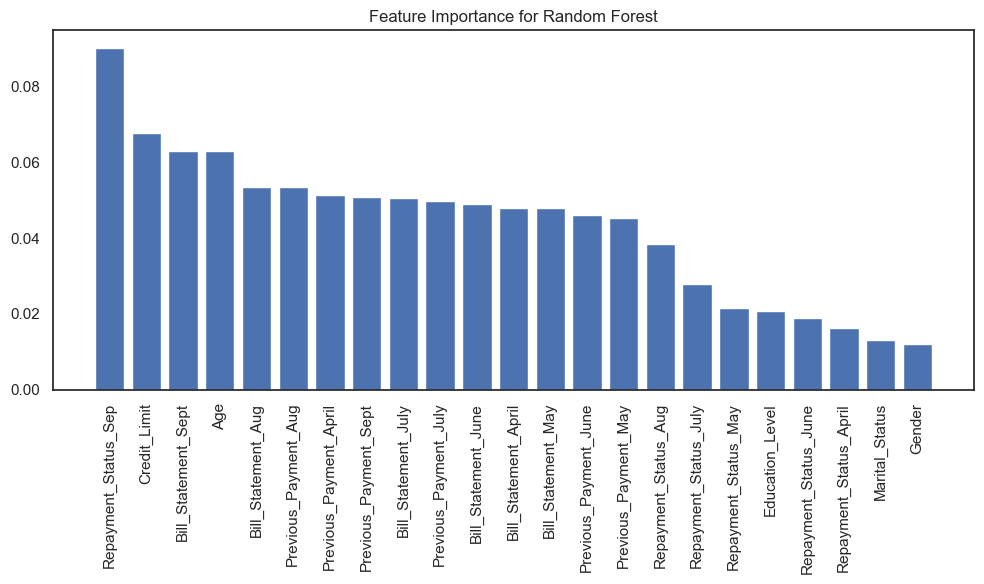

Training and evaluating XGBoost...

Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.88      0.70      0.78      2335
           1       0.38      0.65      0.48       664

    accuracy                           0.69      2999
   macro avg       0.63      0.67      0.63      2999
weighted avg       0.77      0.69      0.71      2999

------------------------------------------------------------


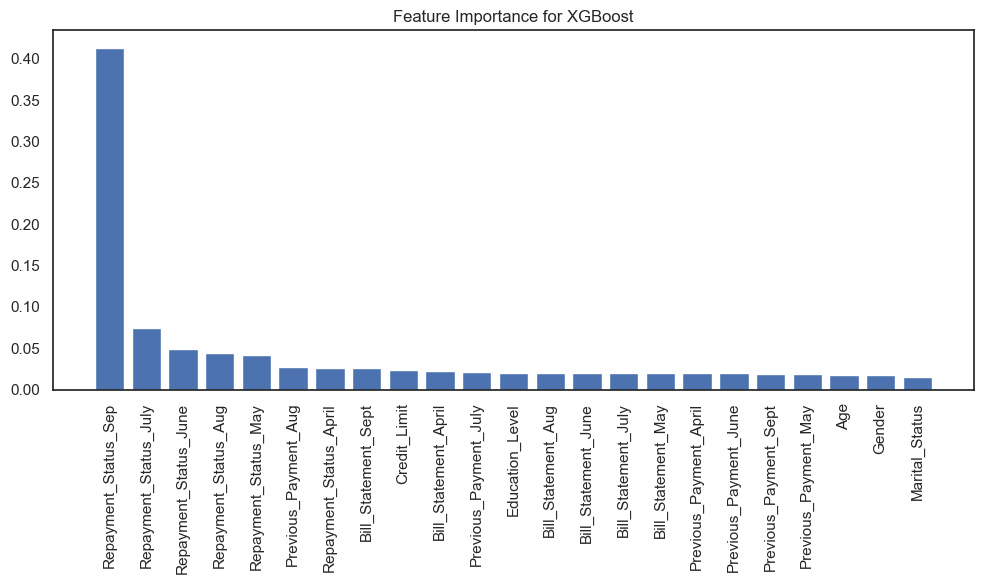

In [53]:
# Define the models to be tested
models = {
    'Support Vector Machine': SVC(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

# Assume X_train_scaled, y_train, X_test_scaled, y_test are already defined
for name, model in models.items():
    print(f"Training and evaluating {name}...")
    model.fit(X_train_res, y_train_res)
    y_pred = model.predict(X_test_scaled)
    report = classification_report(y_test, y_pred)
    print(f"\nClassification Report for {name}:\n")
    print(report)
    print("-" * 60)

  # Plotting feature importance
    if hasattr(model, "feature_importances_"):
        importance = model.feature_importances_
        indices = np.argsort(importance)[::-1]  # Sort features by importance

        plt.figure(figsize=(10, 6))
        plt.title(f"Feature Importance for {name}")
        plt.bar(range(X_train_res.shape[1]), importance[indices], align="center")
        plt.xticks(range(X_train_res.shape[1]), X_train_res.columns[indices], rotation=90)
        plt.tight_layout()
        plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* Under-sampling has successfully improved recall for the minority class across different models, which is beneficial for scenarios where capturing all positives is more critical than minimizing false positives

In [54]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 3.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 4.4 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 3.8 MB/s eta 0:00:00


In [56]:
import optuna

# Define the objective function for Optuna

def objective(trial):
    param = {
        'objective' : 'binary:logistic',
        'eval_metric': 'logloss',
        'verbosity' : 0,
        'booster': 'gbtree',
        'lambda': trial.suggest_float('lambda', 1e-3, 10.0, log=True),
        'alpha': trial.suggest_float('alpha', 1e-3, 10.0, log=True),
        'subsample': trial.suggest_float('subsample', 0.4, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1.0),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'eta': trial.suggest_float('eta', 0.01, 0.3),
        'gamma': trial.suggest_float('gamma', 0, 10),
        'scale_pos_weight': trial.suggest_float('scale_pos_weight', 1, 10),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'max_delta_step': trial.suggest_int('max_delta_step', 0, 10)
    }

    model = XGBClassifier(**param)

    # Calculate the cross-validated f1_score
    f1_scorer = make_scorer(f1_score, average='macro')
    scores = cross_val_score(model, X_train_res, y_train_res, cv=3,scoring=f1_scorer, n_jobs=-1)
    
    return np.mean(scores)

study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective, n_trials=50)

[I 2025-01-03 14:47:24,399] A new study created in memory with name: no-name-a0715106-c1a9-46c2-a1d8-1678ef7c8d6a
[I 2025-01-03 14:47:25,417] Trial 0 finished with value: 0.46405653514955053 and parameters: {'lambda': 0.0010069877675771487, 'alpha': 0.01221498362340883, 'subsample': 0.41361623488536736, 'colsample_bytree': 0.9356831619382218, 'max_depth': 3, 'eta': 0.28659046860587045, 'gamma': 2.139132764376047, 'scale_pos_weight': 9.855132722580453, 'min_child_weight': 5, 'max_delta_step': 10}. Best is trial 0 with value: 0.46405653514955053.
[I 2025-01-03 14:47:25,878] Trial 1 finished with value: 0.5283471620747229 and parameters: {'lambda': 0.01849938407874463, 'alpha': 0.012985353697897589, 'subsample': 0.5388906228188625, 'colsample_bytree': 0.45424579043123275, 'max_depth': 5, 'eta': 0.07994557840058518, 'gamma': 1.359146867978055, 'scale_pos_weight': 4.077494422498274, 'min_child_weight': 10, 'max_delta_step': 6}. Best is trial 1 with value: 0.5283471620747229.
[I 2025-01-03 1

In [59]:
print('Best trial:')
trial = study_xgb.best_trial
print('  F1-score: {}'.format(trial.value))
print('  Params: ')
for key, value in trial.params.items():
    print('    {}: {}'.format(key, value))

best_params = study_xgb.best_params
best_model_xgb = XGBClassifier(**best_params)
best_model_xgb.fit(X_train_res, y_train_res)

# Evaluate on the test set
y_pred = best_model_xgb.predict(X_test_scaled)

report = classification_report(y_test, y_pred)
print(report)


Best trial:
  F1-score: 0.7136002545844852
  Params: 
    lambda: 5.428126677272131
    alpha: 1.8836136533874115
    subsample: 0.5782425074927571
    colsample_bytree: 0.4613761743997621
    max_depth: 7
    eta: 0.16752604503605933
    gamma: 8.223731277820816
    scale_pos_weight: 1.0090825944228092
    min_child_weight: 5
    max_delta_step: 3
              precision    recall  f1-score   support

           0       0.88      0.77      0.82      2335
           1       0.44      0.64      0.52       664

    accuracy                           0.74      2999
   macro avg       0.66      0.71      0.67      2999
weighted avg       0.79      0.74      0.76      2999



## Attempt 3

Handle Class Imbalance using SMOTE Tomek

In [60]:
from imblearn.combine import SMOTETomek

smt = SMOTETomek(random_state=42)
X_train_smt, y_train_smt = smt.fit_resample(X_train_scaled, y_train)
y_train_smt.value_counts()

Default_Payment_Next_Month
1    20225
0    20225
Name: count, dtype: int64

In [61]:
model = LogisticRegression()
model.fit(X_train_smt, y_train_smt)
y_pred = model.predict(X_test_scaled)
report = classification_report(y_test, y_pred)
print(f"\nClassification Report for Logistic Regression:\n")
print(report)


Classification Report for Logistic Regression:

              precision    recall  f1-score   support

           0       0.87      0.82      0.85      2335
           1       0.48      0.57      0.52       664

    accuracy                           0.77      2999
   macro avg       0.67      0.70      0.68      2999
weighted avg       0.78      0.77      0.77      2999



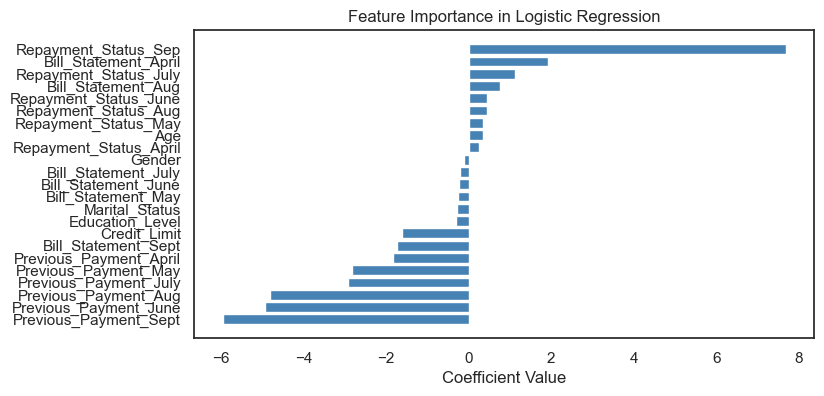

In [63]:
feature_importance = model.coef_[0]

# Create a DataFrame for easier handling
coef_df = pd.DataFrame(feature_importance, index = X_train_smt.columns, columns = ['Coefficients'])

# Sort the coefficients for better visualization
coef_df = coef_df.sort_values(by='Coefficients', ascending=True)

# Plotting
plt.figure(figsize=(8, 4))
plt.barh(coef_df.index, coef_df['Coefficients'], color='steelblue')
plt.xlabel('Coefficient Value')
plt.title('Feature Importance in Logistic Regression')
plt.show()

Training and evaluating Support Vector Machine...

Classification Report for Support Vector Machine:

              precision    recall  f1-score   support

           0       0.87      0.83      0.85      2335
           1       0.49      0.56      0.52       664

    accuracy                           0.77      2999
   macro avg       0.68      0.70      0.69      2999
weighted avg       0.78      0.77      0.78      2999

------------------------------------------------------------
Training and evaluating Random Forest...

Classification Report for Random Forest:

              precision    recall  f1-score   support

           0       0.85      0.88      0.86      2335
           1       0.52      0.46      0.49       664

    accuracy                           0.78      2999
   macro avg       0.68      0.67      0.67      2999
weighted avg       0.78      0.78      0.78      2999

------------------------------------------------------------


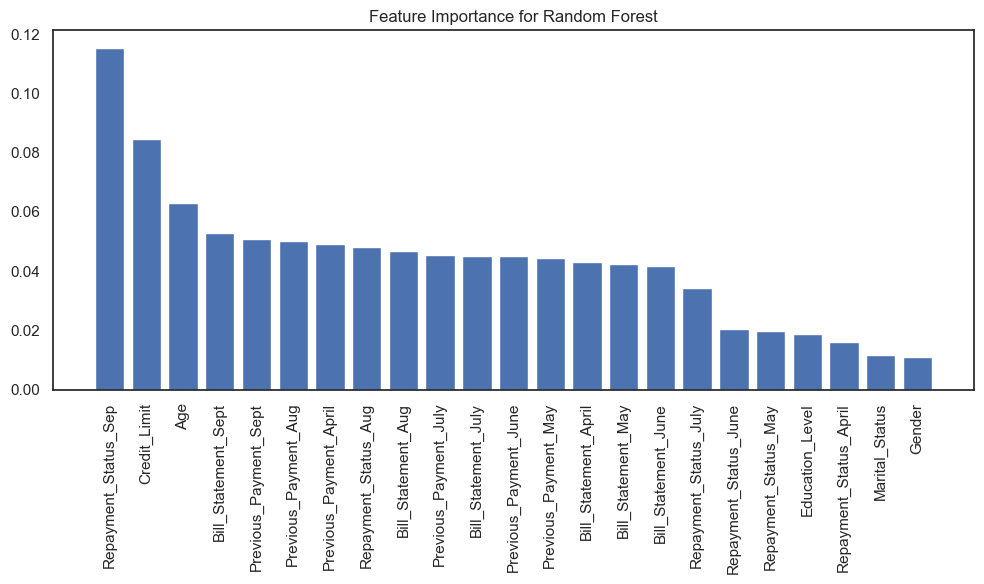

Training and evaluating XGBoost...

Classification Report for XGBoost:

              precision    recall  f1-score   support

           0       0.84      0.91      0.88      2335
           1       0.57      0.40      0.47       664

    accuracy                           0.80      2999
   macro avg       0.71      0.66      0.67      2999
weighted avg       0.78      0.80      0.79      2999

------------------------------------------------------------


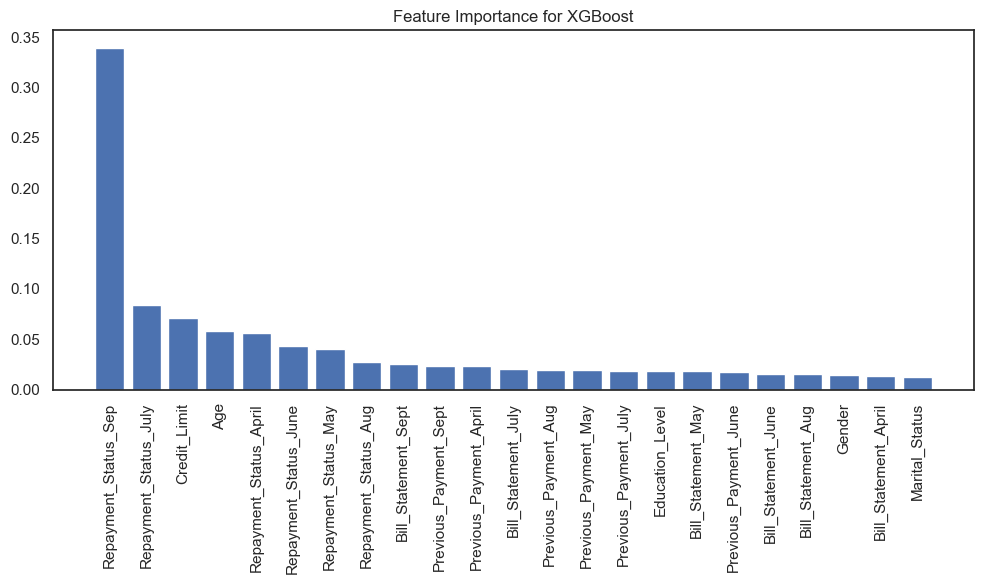

In [64]:
# Define the models to be tested
models = {
    'Support Vector Machine': SVC(),
    'Random Forest': RandomForestClassifier(),
    'XGBoost': XGBClassifier(use_label_encoder=False, eval_metric='logloss')
}

# Assume X_train_scaled, y_train, X_test_scaled, y_test are already defined
for name, model in models.items():
    print(f"Training and evaluating {name}...")
    model.fit(X_train_smt, y_train_smt)
    y_pred = model.predict(X_test_scaled)
    report = classification_report(y_test, y_pred)
    print(f"\nClassification Report for {name}:\n")
    print(report)
    print("-" * 60)

  # Plotting feature importance
    if hasattr(model, "feature_importances_"):
        importance = model.feature_importances_
        indices = np.argsort(importance)[::-1]  # Sort features by importance

        plt.figure(figsize=(10, 6))
        plt.title(f"Feature Importance for {name}")
        plt.bar(range(X_train_smt.shape[1]), importance[indices], align="center")
        plt.xticks(range(X_train_smt.shape[1]), X_train_smt.columns[indices], rotation=90)
        plt.tight_layout()
        plt.show()

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* Using SMOTE didnt effectively increase reall in this case beacuse it might have introduced noise or overlapping examples between clases. As a result, opting for under-sampling to better focus the model on minority class. Under-sampling reduces the dominance of the majority class, allowing the model to identify more True positives in tthe minority class, thus increasing recall. This approach is beneficial when the priority is to capture more instances of the minority class, even if it eans potentiallt increasing false positives

## Model Evaluation :ROC/AUC

In [65]:
print(base_model_report)

              precision    recall  f1-score   support

           0       0.83      0.96      0.89      2335
           1       0.70      0.30      0.42       664

    accuracy                           0.82      2999
   macro avg       0.76      0.63      0.65      2999
weighted avg       0.80      0.82      0.79      2999



In [68]:
probabilities_base_model = base_model.predict_proba(X_test_scaled)[:,1]
fpr_base_model, tpr_base_model, thresholds = roc_curve(y_test, probabilities_base_model)

fpr_base_model[:5], tpr_base_model[:5], thresholds[:5]

(array([0.        , 0.        , 0.00085653, 0.00085653, 0.0012848 ]),
 array([0.        , 0.00150602, 0.00150602, 0.00753012, 0.00753012]),
 array([1.99889295, 0.99889295, 0.99869077, 0.97494208, 0.97486756]))

In [69]:
area_base_model = auc(fpr_base_model, tpr_base_model)
area_base_model

0.7474242795593509

In [70]:
y_pred = best_model_xgb.predict(X_test_scaled)
report = classification_report(y_test, y_pred)
print(report)

              precision    recall  f1-score   support

           0       0.88      0.77      0.82      2335
           1       0.44      0.64      0.52       664

    accuracy                           0.74      2999
   macro avg       0.66      0.71      0.67      2999
weighted avg       0.79      0.74      0.76      2999



In [73]:
probabilities_best_model = best_model_xgb.predict_proba(X_test_scaled)[:,1]
fpr, tpr, threshold = roc_curve(y_test, probabilities_best_model)

fpr_base_model[:5], tpr_base_model[:5], thresholds[:5]

(array([0.        , 0.        , 0.00085653, 0.00085653, 0.0012848 ]),
 array([0.        , 0.00150602, 0.00150602, 0.00753012, 0.00753012]),
 array([1.99889295, 0.99889295, 0.99869077, 0.97494208, 0.97486756]))

In [74]:
area_best_model = auc(fpr, tpr)
area_best_model

0.7721772529088516

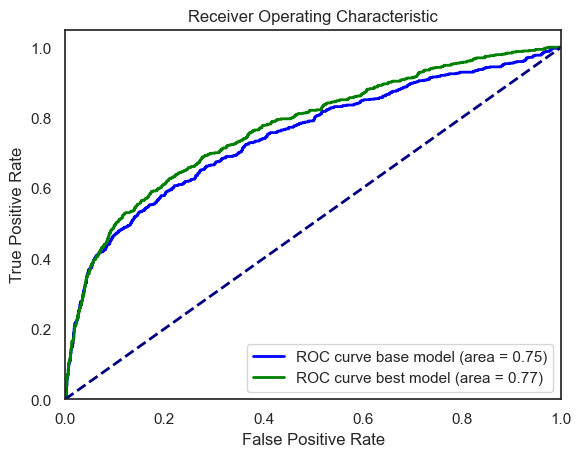

In [75]:
plt.figure()

# Change the color for the base model ROC curve
plt.plot(fpr_base_model, tpr_base_model, color='blue', lw=2, label='ROC curve base model (area = %0.2f)' % area_base_model)

# change the color for the best model ROC curve
plt.plot(fpr, tpr, color='green', lw=2, label='ROC curve best model (area = %0.2f)' % area_best_model)

# The diagonal line for a random classifier
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* The ROC curve shows that the best model (green curve) has a slightly higher AUC (0.77) compared to base model (the blue curve, AUC =0.75). This indicates that the best model has a marginally better overall performance in distinguishing between the positive and negative classes.
* Increase in RECALL : The best model's ROC curve is higher in the top-left portion of the plot, suggestin that it has better recall (True positive rate) at various threshold compared to the base model. This aligns with the goal to increase recall.
* Moderate Improvement: The improvement in AUC and recall is modest but positive, indicating that the changes made to the model have successfully enhanced its ability to correctly identify the positive class

## Model Evaluation : RankOrdering, KS statistic, Gini coeff

In [76]:
probabilities = best_model_xgb.predict_proba(X_test_scaled)[:,1]

df_eval = pd.DataFrame({
    'Default Truth' : y_test,
    'Default Probability' : probabilities
})

df_eval.head()

,Default Truth,Default Probability
0,0,0.64
1,1,0.57
2,0,0.37
3,0,0.24
4,0,0.39


In [77]:
df_eval['Decile'] = pd.qcut(df_eval['Default Probability'], 8, labels=False, duplicates='drop')
df_eval.head(3)

,Default Truth,Default Probability,Decile
0,0,0.64,6
1,1,0.57,6
2,0,0.37,3


In [79]:
df_eval[df_eval.Decile==7]['Default Probability'].describe()

count   375.00
mean      0.86
std       0.05
min       0.75
25%       0.83
50%       0.87
75%       0.90
max       0.94
Name: Default Probability, dtype: float64

In [80]:
df_decile = df_eval.groupby('Decile').apply(lambda x: pd.Series({
    'Minimum Probability': x['Default Probability'].min(),
    'Maximum Probability': x['Default Probability'].max(),
    'Events': x['Default Truth'].sum(),
    'Non-events': x['Default Truth'].count() - x['Default Truth'].sum(),
}))
df_decile.reset_index(inplace=True)
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events
0,0,0.07,0.21,17.00,358.00
1,1,0.21,0.28,40.00,335.00
2,2,0.28,0.32,42.00,333.00
3,3,0.32,0.38,41.00,334.00
4,4,0.38,0.46,64.00,310.00
5,5,0.46,0.57,84.00,291.00
6,6,0.57,0.75,124.00,251.00
7,7,0.75,0.94,252.00,123.00


In [81]:
df_decile['Event Rate'] = df_decile['Events']*100 / (df_decile['Events']+df_decile['Non-events'])
df_decile['Non-event Rate'] = df_decile['Non-events']*100 / (df_decile['Events']+df_decile['Non-events'])
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events,Event Rate,Non-event Rate
0,0,0.07,0.21,17.00,358.00,4.53,95.47
1,1,0.21,0.28,40.00,335.00,10.67,89.33
2,2,0.28,0.32,42.00,333.00,11.20,88.80
3,3,0.32,0.38,41.00,334.00,10.93,89.07
4,4,0.38,0.46,64.00,310.00,17.11,82.89
5,5,0.46,0.57,84.00,291.00,22.40,77.60
6,6,0.57,0.75,124.00,251.00,33.07,66.93
7,7,0.75,0.94,252.00,123.00,67.20,32.80


In [82]:
df_decile = df_decile.sort_values(by='Decile', ascending=False).reset_index(drop=True)
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events,Event Rate,Non-event Rate
0,7,0.75,0.94,252.00,123.00,67.20,32.80
1,6,0.57,0.75,124.00,251.00,33.07,66.93
2,5,0.46,0.57,84.00,291.00,22.40,77.60
3,4,0.38,0.46,64.00,310.00,17.11,82.89
4,3,0.32,0.38,41.00,334.00,10.93,89.07
5,2,0.28,0.32,42.00,333.00,11.20,88.80
6,1,0.21,0.28,40.00,335.00,10.67,89.33
7,0,0.07,0.21,17.00,358.00,4.53,95.47


In [83]:
df_decile['Cum Events'] =  df_decile['Events'].cumsum()
df_decile['Cum Non-events'] =  df_decile['Non-events'].cumsum()
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events,Event Rate,Non-event Rate,Cum Events,Cum Non-events
0,7,0.75,0.94,252.00,123.00,67.20,32.80,252.00,123.00
1,6,0.57,0.75,124.00,251.00,33.07,66.93,376.00,374.00
2,5,0.46,0.57,84.00,291.00,22.40,77.60,460.00,665.00
3,4,0.38,0.46,64.00,310.00,17.11,82.89,524.00,975.00
4,3,0.32,0.38,41.00,334.00,10.93,89.07,565.00,1309.00
5,2,0.28,0.32,42.00,333.00,11.20,88.80,607.00,1642.00
6,1,0.21,0.28,40.00,335.00,10.67,89.33,647.00,1977.00
7,0,0.07,0.21,17.00,358.00,4.53,95.47,664.00,2335.00


In [84]:
df_decile['Cum Event Rate'] = df_decile['Cum Events'] * 100 / df_decile['Events'].sum()
df_decile['Cum Non-event Rate'] = df_decile['Cum Non-events']*100 / df_decile['Non-events'].sum()
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events,Event Rate,Non-event Rate,Cum Events,Cum Non-events,Cum Event Rate,Cum Non-event Rate
0,7,0.75,0.94,252.00,123.00,67.20,32.80,252.00,123.00,37.95,5.27
1,6,0.57,0.75,124.00,251.00,33.07,66.93,376.00,374.00,56.63,16.02
2,5,0.46,0.57,84.00,291.00,22.40,77.60,460.00,665.00,69.28,28.48
3,4,0.38,0.46,64.00,310.00,17.11,82.89,524.00,975.00,78.92,41.76
4,3,0.32,0.38,41.00,334.00,10.93,89.07,565.00,1309.00,85.09,56.06
5,2,0.28,0.32,42.00,333.00,11.20,88.80,607.00,1642.00,91.42,70.32
6,1,0.21,0.28,40.00,335.00,10.67,89.33,647.00,1977.00,97.44,84.67
7,0,0.07,0.21,17.00,358.00,4.53,95.47,664.00,2335.00,100.00,100.00


In [85]:
df_decile['KS'] = abs(df_decile['Cum Event Rate'] - df_decile['Cum Non-event Rate'])
df_decile

,Decile,Minimum Probability,Maximum Probability,Events,Non-events,Event Rate,Non-event Rate,Cum Events,Cum Non-events,Cum Event Rate,Cum Non-event Rate,KS
0,7,0.75,0.94,252.00,123.00,67.20,32.80,252.00,123.00,37.95,5.27,32.68
1,6,0.57,0.75,124.00,251.00,33.07,66.93,376.00,374.00,56.63,16.02,40.61
2,5,0.46,0.57,84.00,291.00,22.40,77.60,460.00,665.00,69.28,28.48,40.80
3,4,0.38,0.46,64.00,310.00,17.11,82.89,524.00,975.00,78.92,41.76,37.16
4,3,0.32,0.38,41.00,334.00,10.93,89.07,565.00,1309.00,85.09,56.06,29.03
5,2,0.28,0.32,42.00,333.00,11.20,88.80,607.00,1642.00,91.42,70.32,21.09
6,1,0.21,0.28,40.00,335.00,10.67,89.33,647.00,1977.00,97.44,84.67,12.77
7,0,0.07,0.21,17.00,358.00,4.53,95.47,664.00,2335.00,100.00,100.00,0.00


In [86]:
gini_coefficient = 2 * area_best_model - 1

print("AUC:", area_best_model)
print("Gini Coefficient:", gini_coefficient)

AUC: 0.7721772529088516
Gini Coefficient: 0.5443545058177033


<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; text-align:left">

<h3 align="left"><font color=blue>Insights:</font></h3>

* AUC of 0.77: The model is good at distinguishing between events and non-events.
* Gini coefficient of 0.54: This further confirms that the model is effective in its predictions. The Gini coefficient ranges from -1 to 1, where a value closer to 1 signifies a perfect model, 0 indicates a model with no discriminative power, and -1 signifies a perfectly incorrect model.



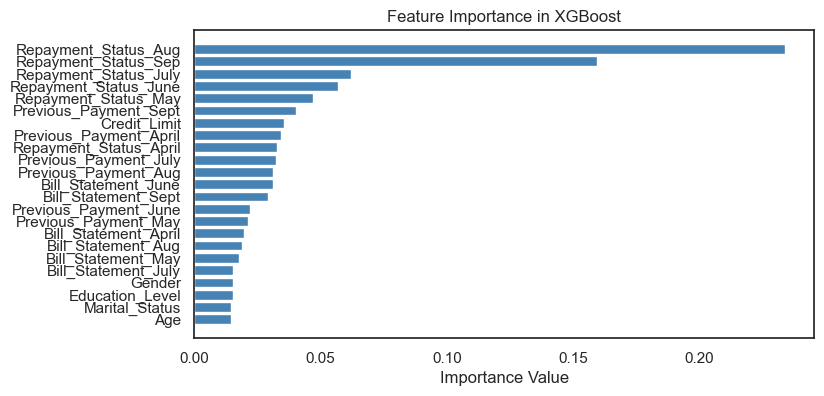

In [87]:
final_model = best_model_xgb
# Extract feature importances
feature_importance = final_model.feature_importances_

# Create a DataFrame for easier handling
coef_df = pd.DataFrame(feature_importance, index=X_train_scaled.columns, columns=['Importance'])

# Sort the feature importances for better visualization
coef_df = coef_df.sort_values(by='Importance', ascending=True)

# Plotting
plt.figure(figsize=(8, 4))
plt.barh(coef_df.index, coef_df['Importance'], color='steelblue')
plt.xlabel('Importance Value')
plt.title('Feature Importance in XGBoost')
plt.show()

# Save the Model

In [90]:
import os
from joblib import dump

os.makedirs('artifacts', exist_ok = True)

# Save the model

model_data = {'model' : final_model, 
              'features' : X_train_scaled.columns,
              'scaler' : scaler,
}

dump(model_data, 'artifacts/model_data.joblib')


['artifacts/model_data.joblib']

In [91]:
data_train.columns

Index(['Credit_Limit', 'Gender', 'Education_Level', 'Marital_Status', 'Age',
       'Repayment_Status_Sep', 'Repayment_Status_Aug', 'Repayment_Status_July',
       'Repayment_Status_June', 'Repayment_Status_May',
       'Repayment_Status_April', 'Bill_Statement_Sept', 'Bill_Statement_Aug',
       'Bill_Statement_July', 'Bill_Statement_June', 'Bill_Statement_May',
       'Bill_Statement_April', 'Previous_Payment_Sept', 'Previous_Payment_Aug',
       'Previous_Payment_July', 'Previous_Payment_June',
       'Previous_Payment_May', 'Previous_Payment_April',
       'Default_Payment_Next_Month'],
      dtype='object')